## Tabular 和 Collab 之间的关系

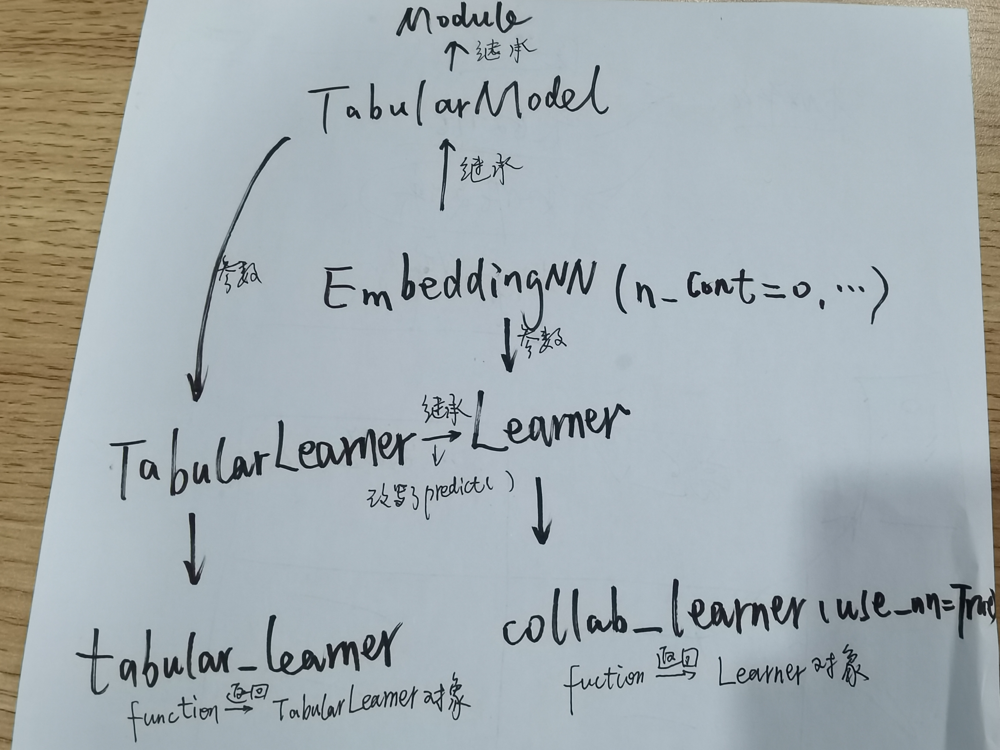

## 打印一个DataFrame数据集的列名，列数据类型，对应的取值

In [ ]:
col_dtypes=list(df.dtypes.iteritems())
print(f'    共有{len(col_dtypes)}列：')
for col_dtype in col_dtypes:    
    c=col_dtype[0]
    dtype=col_dtype[1]
    Unique_Values=df[c].unique()
    l=len(Unique_Values)
    out=f'{c}:{dtype} ({l})={Unique_Values[0:10]}'
    if len(out)>100:
        out=out[0:100]+"......"
    print("    "+out)

In [ ]:
df_nn['ProductSize'] = df_nn['ProductSize'].astype('category')
df_nn['ProductSize'].cat.set_categories(sizes, ordered=True, inplace=True)
df_nn[dep_var] = np.log(df_nn[dep_var])

## 修改了fastai2的方法，丰富了其中的整数、浮点数类型,增加了连续变量取值数量的打印输出

In [1]:
def cont_cat_split(df, max_card=20, dep_var=None,verbose_info=True):
    "Helper function that returns column names of cont and cat variables from given `df`."
    cont_names, cat_names = [], []
    for label in df:
        if label in L(dep_var): continue
        if df[label].dtype in [int,np.int64,np.int32] and df[label].unique().shape[0] > max_card or df[label].dtype in [float,np.float64,np.float32]:
            if verbose_info:print(f"连续变量_{label}: length={len(df[label].unique())}")
            cont_names.append(label)
        else: cat_names.append(label)
    return cont_names, cat_names

### jupyterlab增加和更改虚拟环境（多个切换）

In [2]:
!conda env list

# conda environments:
#
base                     C:\Users\HP\miniconda3
d2l                      C:\Users\HP\miniconda3\envs\d2l
fastai2book           *  C:\Users\HP\miniconda3\envs\fastai2book
fastbook_learning        C:\Users\HP\miniconda3\envs\fastbook_learning



### !!!重要 切换到你的目标conda env: d2l (在终端进行操作)

In [ ]:
# !conda list  # to find ipykernel is installed already
# # conda install ipykernel # 如果没有安装就安装
conda activate d2l

### 安装你想要增加的虚拟环境

In [11]:
# !python -m ipykernel install --user --name d2l  

Installed kernelspec d2l in C:\Users\HP\AppData\Roaming\jupyter\kernels\d2l


### 重新载入（刷新）页面，在下面示意的菜单中操作

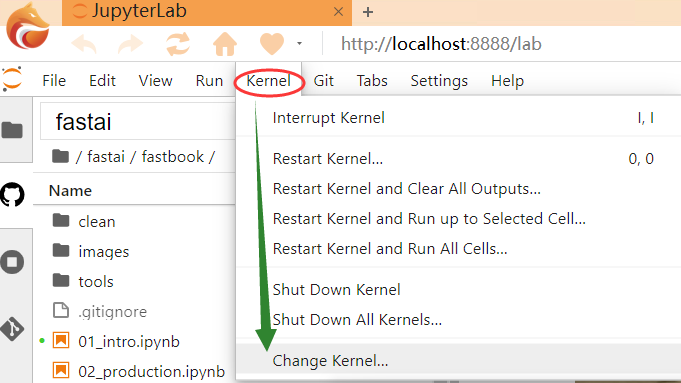

## shuffle前必须转变成list

In [7]:
import random
import torch as tc

In [8]:
a=tc.arange(10)
b=list(tc.arange(10))
a,b

(tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [tensor(0),
  tensor(1),
  tensor(2),
  tensor(3),
  tensor(4),
  tensor(5),
  tensor(6),
  tensor(7),
  tensor(8),
  tensor(9)])

In [9]:
random.shuffle(a)
a

tensor([0, 0, 0, 1, 4, 4, 2, 6, 2, 9])

In [10]:
random.shuffle(b)
b

[tensor(7),
 tensor(3),
 tensor(2),
 tensor(6),
 tensor(8),
 tensor(9),
 tensor(5),
 tensor(1),
 tensor(0),
 tensor(4)]

## 获取线程数num_workers

In [4]:
"""Use 4 processes to read the data except for Windows."""
def get_dataloader_workers(default_num_workers=4): 
    import sys  
    return 0 if sys.platform.startswith('win') else default_num_workers

In [5]:
get_dataloader_workers()

0

## 循环打印出Sequential model的末端类型

In [3]:
def print_net_layers_details(net,l=-1):
    if not isinstance(net,nn.Sequential):
        #print(net)
        pass
    else:
        l+=1
        for i in range(len(net)):
            l_name=net[i].name
            l_weight_name=l_name+'_weight'
            #print(f"  {'  '*l}({l}):{l_name},shape:{net[i].collect_params()[l_weight_name].data().shape}")
            #if isinstance(net[i],nn.Dense):
                
            print(f"  {'   '*l}({l}):{l_name}")
            print_net_layers_details(net[i],l)   

In [18]:
from mxnet.gluon import nn
def block1():
    net=nn.Sequential()
    net.add(nn.Dense(32,activation='relu'))
    net.add(nn.Dense(16,activation='relu'))
    return net
def block2():
    net=nn.Sequential()
    for _ in range(4):
        net.add(block1())
    return net
rgnet=nn.Sequential()
rgnet.add(block2())
rgnet.add(nn.Dense(10))
rgnet.initialize()

In [19]:
print_net_layers_details(rgnet)

  (0):sequential7
     (1):sequential8
        (2):dense9
        (2):dense10
     (1):sequential9
        (2):dense11
        (2):dense12
     (1):sequential10
        (2):dense13
        (2):dense14
     (1):sequential11
        (2):dense15
        (2):dense16
  (0):dense17


In [22]:
rgnet.collect_params()['dense9_weight']

Parameter dense9_weight (shape=(32, 0), dtype=float32)

## 自定义tensorflow的权重初始化函数

https://d2l.ai/chapter_deep-learning-computation/parameters.html#exercises

In [ ]:
class MyInit(tf.keras.initializers.Initializer):
    def __call__(self, shape, dtype=None):
        data=tf.random.uniform(shape,-10, 10, dtype=dtype)
        factor=(tf.abs(data)>=5)
        factor=tf.cast(factor,tf.float32)
        return data*factor

## 自定义tensorflow keras 模型
### --build方法

In [17]:
import tensorflow as tf
import tensorflow.keras as K
class MyDense(K.Model):
    def __init__(self,n_out):
        super().__init__()
        self.units=n_out
    def build(self,input_shape=(2,10)):
        print("must call 'super().build(input_shape)' for init 'net.weights' properly!")
        self.weight=self.add_weight(name='weight',shape=[input_shape[-1],self.units],initializer=tf.random_normal_initializer())
        print(self.weight.shape)
        self.bias  =self.add_weight(name='bias',shape=[self.units],initializer=tf.zeros_initializer())
#         super().build(input_shape)
        #super(MyDense,self).build(input_shape)
    def call(self,X):
        X=tf.matmul(X,self.weight)+self.bias
        return tf.nn.relu(X)
        #return K.layers.ReLU(X)

In [18]:
net=MyDense(3);net2=MyDense(7)
net.build(input_shape=(2,10))
net2.build()

must call 'super().build(input_shape)' for init 'net.weights' properly!
(10, 3)
must call 'super().build(input_shape)' for init 'net.weights' properly!
(10, 7)


In [19]:
net.weights

ValueError: Weights for model my_dense_10 have not yet been created. Weights are created when the Model is first called on inputs or `build()` is called with an `input_shape`.

## 打印torch model 的参数数量（分层）

In [16]:
import torch as tc
def count_layers_params(model,X=None,verbose=False):
    # Find total parameters and trainable parameters
    total_params = sum(p.numel() for p in model.parameters())
    print(f'{total_params:,} total parameters.')
    total_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'{total_trainable_params:,} training parameters.\n')
    
    i=0
    for layer in model:    
        name=layer if verbose else layer.__class__.__name__
        print(f"--Layer {i} :{name},  Params:{sum(p.numel() for p in layer.parameters())},  Trainable Params:{sum(p.numel() for p in layer.parameters() if p.requires_grad)}")
        if X is not None:
            X = layer(X)
            print('  ----output shape:',X.shape)
        i+=1
        print('\n')

In [6]:
class Reshape(tc.nn.Module):
    def forward(self ,x ):
        return x.view((-1,1)+x.shape)
net_tc=tc.nn.Sequential(
    Reshape(),
    tc.nn.Conv2d(1,6,kernel_size=5,padding=2),
    tc.nn.ReLU(),
    tc.nn.MaxPool2d(kernel_size=2,stride=2),
    tc.nn.Conv2d(6,16,kernel_size=5),
    tc.nn.ReLU(),
    tc.nn.MaxPool2d(kernel_size=2,stride=2),
    tc.nn.Flatten(),
    tc.nn.Linear(16*5*5,120),
    tc.nn.ReLU(),
    tc.nn.Linear(120,84),
    tc.nn.ReLU(),
    tc.nn.Linear(84,10)
)

In [10]:
# count_layers_params(net_tc,verbose=False)

In [11]:
# count_layers_params(net_tc,verbose=True)

In [12]:
# X = tc.randn(size=(28, 28), dtype=tc.float32)
# count_layers_params(net_tc,X=X,verbose=True)

# Conv层的计算及Channels的影响

http://d2l.ai/chapter_convolutional-neural-networks/channels.html

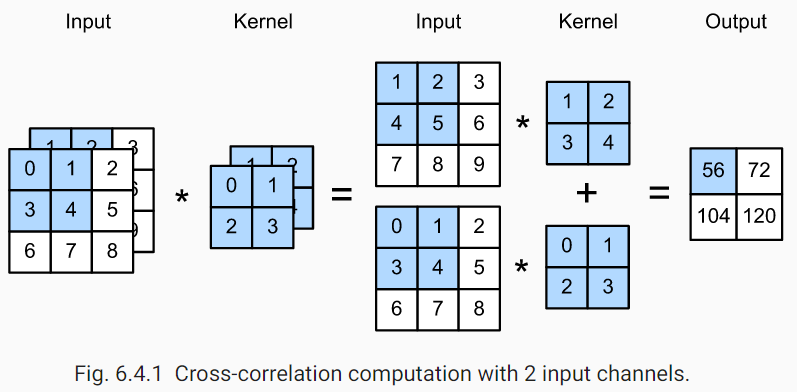

## --初始化权重是有影响的

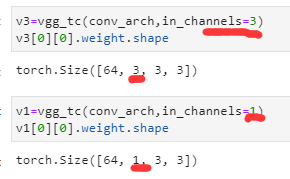

## --Conv2d权重参数量的差异

### --Conv2d权重参数数量计算：(num_channels * kernel_h * kernel_w + 1bias) * out_channels

In [33]:
def num_conv2d_params(num_channels,kernel_h , kernel_w , out_channels):
    nums=(num_channels * kernel_h * kernel_w + 1) * out_channels
    return nums

In [35]:
num_conv2d_params(3,3,3,64),num_conv2d_params(1,3,3,64)

(1792, 640)

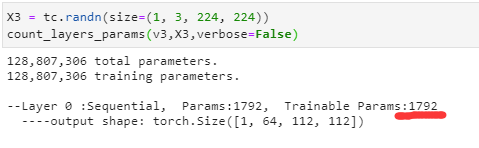
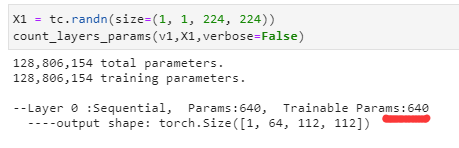

## --但Conv2d的输出并没有差异
### --具体原因见上面大图

In [3]:
from torch import nn
def vgg_block_tc(num_conv_layers,in_channels,out_channels):
    layers=[]
    for _ in range(num_conv_layers):
        layers.append(nn.Conv2d(in_channels,out_channels,kernel_size=3,padding=1))
        layers.append(nn.ReLU())
        in_channels=out_channels
    layers.append(nn.MaxPool2d(kernel_size=2,stride=2))
    return nn.Sequential(*layers)
def vgg_tc(conv_arch,in_channels=1):
    sequential_blocks=[]
    for num_conv_layers,out_channels in conv_arch:
        sequential_block=vgg_block_tc(num_conv_layers,in_channels,out_channels)
        in_channels=out_channels
        sequential_blocks.append(sequential_block)
    dense_blocks=[nn.Flatten(),
                  nn.Linear(out_channels*7*7,4096),nn.ReLU(),nn.Dropout(),
                  nn.Linear(4096,4096),nn.ReLU(),nn.Dropout(),
                  nn.Linear(4096,10)]
    blocks=sequential_blocks+dense_blocks
       
    return nn.Sequential(*blocks)   

In [4]:
conv_arch = ((1, 64), (1, 128), (2, 256), (2, 512), (2, 512))

In [22]:
v3=vgg_tc(conv_arch,in_channels=3)
v3[0][0].weight.shape

torch.Size([64, 3, 3, 3])

In [21]:
v1=vgg_tc(conv_arch,in_channels=1)
v1[0][0].weight.shape

torch.Size([64, 1, 3, 3])

In [19]:
X3 = tc.randn(size=(1, 3, 224, 224))
count_layers_params(v3,X3,verbose=False)

128,807,306 total parameters.
128,807,306 training parameters.

--Layer 0 :Sequential,  Params:1792,  Trainable Params:1792
  ----output shape: torch.Size([1, 64, 112, 112])


--Layer 1 :Sequential,  Params:73856,  Trainable Params:73856
  ----output shape: torch.Size([1, 128, 56, 56])


--Layer 2 :Sequential,  Params:885248,  Trainable Params:885248
  ----output shape: torch.Size([1, 256, 28, 28])


--Layer 3 :Sequential,  Params:3539968,  Trainable Params:3539968
  ----output shape: torch.Size([1, 512, 14, 14])


--Layer 4 :Sequential,  Params:4719616,  Trainable Params:4719616
  ----output shape: torch.Size([1, 512, 7, 7])


--Layer 5 :Flatten,  Params:0,  Trainable Params:0
  ----output shape: torch.Size([1, 25088])


--Layer 6 :Linear,  Params:102764544,  Trainable Params:102764544
  ----output shape: torch.Size([1, 4096])


--Layer 7 :ReLU,  Params:0,  Trainable Params:0
  ----output shape: torch.Size([1, 4096])


--Layer 8 :Dropout,  Params:0,  Trainable Params:0
  ----output sh

In [20]:
X1 = tc.randn(size=(1, 1, 224, 224))
count_layers_params(v1,X1,verbose=False)

128,806,154 total parameters.
128,806,154 training parameters.

--Layer 0 :Sequential,  Params:640,  Trainable Params:640
  ----output shape: torch.Size([1, 64, 112, 112])


--Layer 1 :Sequential,  Params:73856,  Trainable Params:73856
  ----output shape: torch.Size([1, 128, 56, 56])


--Layer 2 :Sequential,  Params:885248,  Trainable Params:885248
  ----output shape: torch.Size([1, 256, 28, 28])


--Layer 3 :Sequential,  Params:3539968,  Trainable Params:3539968
  ----output shape: torch.Size([1, 512, 14, 14])


--Layer 4 :Sequential,  Params:4719616,  Trainable Params:4719616
  ----output shape: torch.Size([1, 512, 7, 7])


--Layer 5 :Flatten,  Params:0,  Trainable Params:0
  ----output shape: torch.Size([1, 25088])


--Layer 6 :Linear,  Params:102764544,  Trainable Params:102764544
  ----output shape: torch.Size([1, 4096])


--Layer 7 :ReLU,  Params:0,  Trainable Params:0
  ----output shape: torch.Size([1, 4096])


--Layer 8 :Dropout,  Params:0,  Trainable Params:0
  ----output shap